## A cycle of reactions `A <-> B <-> C <-> A`  IN-PROGRESS
#### the "closing" of the above cycle (the "return" parth from `C` to `A`) is coupled with an "energy donor" reaction:
#### `C + E_High <-> A + E_Low`
#### where `E_High` and `E_Low` are, respectively, the high- and low- energy molecules that drive the cycle (for example, think of ATP/ADP).   
Comparisons are made between results obtained with 3 different time resolutions.

All 1st-order kinetics.    

LAST REVISED: Jan. 27, 2023

In [1]:
# Extend the sys.path variable, to contain the project's root directory
import set_path
set_path.add_ancestor_dir_to_syspath(2)  # The number of levels to go up 
                                         # to reach the project's home, from the folder containing this notebook

Added 'D:\Docs\- MY CODE\BioSimulations\life123-Win7' to sys.path


In [2]:
from experiments.get_notebook_info import get_notebook_basename

from modules.reactions.reaction_data import ReactionData as chem
from modules.reactions.reaction_dynamics import ReactionDynamics
from modules.numerical.numerical import Numerical as num

import numpy as np
import plotly.express as px
from modules.visualization.graphic_log import GraphicLog

In [3]:
# Initialize the HTML logging
log_file = get_notebook_basename() + ".log.htm"    # Use the notebook base filename for the log file

# Set up the use of some specified graphic (Vue) components
GraphicLog.config(filename=log_file,
                  components=["vue_cytoscape_1"],
                  extra_js="https://cdnjs.cloudflare.com/ajax/libs/cytoscape/3.21.2/cytoscape.umd.js")

-> Output will be LOGGED into the file 'cycles_1.log.htm'


### Initialize the system

In [4]:
# Initialize the system
chem_data = chem(names=["A", "B", "C", "E_high", "E_low"])

# Reaction A <-> B, mostly in forward direction (favored energetically)
# Note: all reactions in this experiment have 1st-order kinetics for all species
chem_data.add_reaction(reactants="A", products="B",
                       forward_rate=9., reverse_rate=3.)

# Reaction B <-> C, also favored energetically
chem_data.add_reaction(reactants="B", products="C",
                       forward_rate=8., reverse_rate=4.)

# Reaction C + E_High <-> A + E_Low, also favored energetically, but kinetically slow
# Note that, thanks to the energy donation from E, we can go "upstream" from C, to the higher-energy level of "A"
chem_data.add_reaction(reactants=["C" , "E_high"], products=["A", "E_low"],
                       forward_rate=1., reverse_rate=0.2)

chem_data.describe_reactions()

# Send the plot of the reaction network to the HTML log file
graph_data = chem_data.prepare_graph_network()
GraphicLog.export_plot(graph_data, "vue_cytoscape_1")

Number of reactions: 3 (at temp. 25 C)
0: A <-> B  (kF = 9 / kR = 3 / Delta_G = -2,723.41 / K = 3) | 1st order in all reactants & products
1: B <-> C  (kF = 8 / kR = 4 / Delta_G = -1,718.28 / K = 2) | 1st order in all reactants & products
2: C + E_high <-> A + E_low  (kF = 1 / kR = 0.2 / Delta_G = -3,989.73 / K = 5) | 1st order in all reactants & products
[GRAPHIC ELEMENT SENT TO LOG FILE `cycles_1.log.htm`]


### Set the initial concentrations of all the chemicals

In [5]:
initial_conc = {"A": 100., "B": 0., "C": 0., "E_high": 1000., "E_low": 0.}  # Note the abundant energy source "E_high"
initial_conc

{'A': 100.0, 'B': 0.0, 'C': 0.0, 'E_high': 1000.0, 'E_low': 0.0}

### We'll split each simulation in three segments (apparent from the graphs of the runs, further down):  
Time [0-0.03] fast changes   
Time [0.03-5.] medium changes   
Time [5.-8.] slow changes, as we approach equilibrium  

### and we'll do MULTIPLE RUNS, at varying time resolutions.

# Run # 1 : FIXED time resolution, with COARSE time steps   
(trial and error, not shown, reveals that increasing any of the time steps below, leads to "excessive time step" errors)

In [6]:
dynamics = ReactionDynamics(reaction_data=chem_data)
dynamics.set_conc(conc=initial_conc, snapshot=True)
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
5 species:
  Species 0 (A). Conc: 100.0
  Species 1 (B). Conc: 0.0
  Species 2 (C). Conc: 0.0
  Species 3 (E_high). Conc: 1000.0
  Species 4 (E_low). Conc: 0.0


In [7]:
dynamics.set_diagnostics()       # To save diagnostic information about the call to single_compartment_react()

In [8]:
dynamics.single_compartment_react(time_step=0.0008, stop_time=0.03)
#dynamics.get_history()

In [9]:
dynamics.single_compartment_react(time_step=0.001, stop_time=5.)
#dynamics.get_history()

In [10]:
dynamics.single_compartment_react(time_step=0.005, stop_time=8.)

In [11]:
df = dynamics.get_history()
df

,SYSTEM TIME,A,B,C,E_high,E_low,caption
0,0.0000,100.000000,0.000000,0.000000,1000.000000,0.000000,Initial state
1,0.0008,99.280000,0.720000,0.000000,1000.000000,0.000000,
2,0.0016,98.566912,1.428480,0.004608,1000.000000,0.000000,
3,0.0024,97.864345,2.125606,0.010049,999.996314,0.003686,
4,0.0032,97.172805,2.811556,0.015639,999.988332,0.011668,
...,...,...,...,...,...,...,...
5604,7.9804,10.018545,30.006917,59.974537,32.331113,967.668887,
5605,7.9854,10.018398,30.006862,59.974740,32.330530,967.669470,
5606,7.9904,10.018251,30.006808,59.974942,32.329952,967.670048,
5607,7.9954,10.018105,30.006753,59.975142,32.329378,967.670622,


### Notice we created 5,609 data points

In [12]:
dynamics.explain_time_advance()

From time 0 to 0.0304, in 38 FULL steps of 0.0008
From time 0.0304 to 5, in 4970 FULL steps of 0.001
From time 5 to 8, in 600 FULL steps of 0.005


## Plots of changes of concentration with time

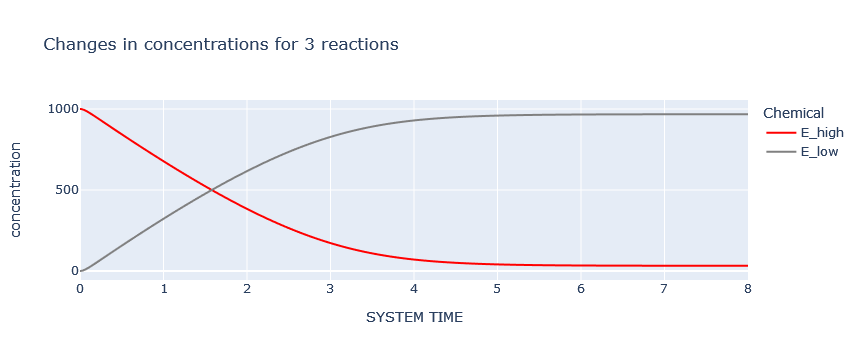

In [13]:
dynamics.plot_curves(chemicals=["E_high", "E_low"], colors=["red", "grey"])

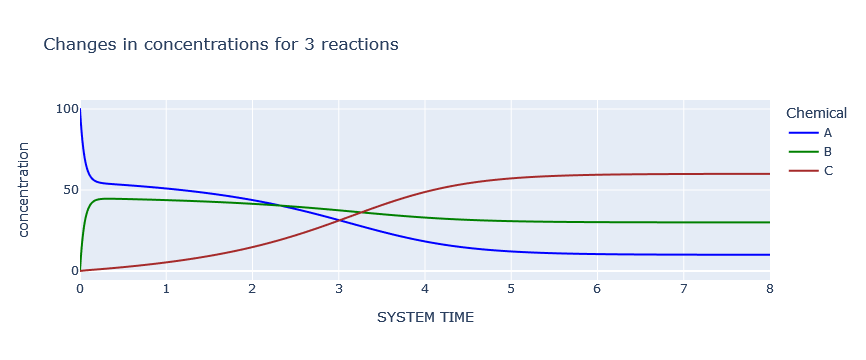

In [14]:
dynamics.plot_curves(chemicals=["A", "B", "C"])

### The plots has 4 distinctive intersections; locate them and save them for later comparisons across repeated runs:

In [15]:
run1 = []

In [16]:
run1.append(dynamics.curve_intersection(t_start=1., t_end=2., var1="E_high", var2="E_low"))

Min abs distance found at row: 1586


In [17]:
run1.append(dynamics.curve_intersection(t_start=2.31, t_end=2.33, var1="A", var2="B"))

Min abs distance found at row: 2332


In [18]:
run1.append(dynamics.curve_intersection(t_start=3., t_end=4., var1="A", var2="C"))

Min abs distance found at row: 3017


In [19]:
run1.append(dynamics.curve_intersection(t_start=3., t_end=4., var1="B", var2="C"))

Min abs distance found at row: 3270


In [20]:
run1

[(1.5782463316015305, 499.9999999999999),
 (2.324208426199163, 40.36968965779538),
 (3.0098252303164066, 31.29187589510951),
 (3.2624567026161637, 36.1939052299051)]

### Verify the final equilibrium state:

In [21]:
dynamics.is_in_equilibrium()

A <-> B
Final concentrations:  [B] = 30.01 ; [A] = 10.02
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 2.99529
    Formula used:  [B] / [A]
2. Ratio of forward/reverse reaction rates: 3.0
Discrepancy between the two values: 0.157 %
Reaction IS in equilibrium (within 1% tolerance)

B <-> C
Final concentrations:  [C] = 59.98 ; [B] = 30.01
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 1.99873
    Formula used:  [C] / [B]
2. Ratio of forward/reverse reaction rates: 2.0
Discrepancy between the two values: 0.06342 %
Reaction IS in equilibrium (within 1% tolerance)

C + E_high <-> A + E_low
Final concentrations:  [A] = 10.02 ; [E_low] = 967.7 ; [C] = 59.98 ; [E_high] = 32.33
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 4.99971
    Formula used:  ([A][E_low]) / ([C][E_high])
2. Ratio of forward/reverse reaction rates: 5.0
Discrepancy between the two values: 0.005823 %
Reaction IS in equilibrium (within 1% t

True

# _NOTE: Everything below is JUST A REPEAT of the same experiment, with different time steps, for accuracy comparisons_

# Run # 2. VARIABLE time resolution, using the same primary time steps as in run #1

In [22]:
dynamics = ReactionDynamics(reaction_data=chem_data)   # Note: OVER-WRITING the "dynamics" object
dynamics.set_conc(conc=initial_conc, snapshot=True) 
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
5 species:
  Species 0 (A). Conc: 100.0
  Species 1 (B). Conc: 0.0
  Species 2 (C). Conc: 0.0
  Species 3 (E_high). Conc: 1000.0
  Species 4 (E_low). Conc: 0.0


In [23]:
dynamics.set_diagnostics()       # To save diagnostic information about the call to single_compartment_react()

In [24]:
dynamics.single_compartment_react(time_step=0.0008, stop_time=0.03,
                                  dynamic_steps=2, abs_fast_threshold=750.)
# Note: the threshold values were picked by trial and error (not shown) 
# to be neither too small nor too large - leading to substeps being used roughly 1/2 of the time

single_compartment_react(): setting fast_threshold to 60.0


In [25]:
dynamics.single_compartment_react(time_step=0.001, stop_time=5.,
                                 dynamic_steps=2, abs_fast_threshold=250.)

single_compartment_react(): setting fast_threshold to 25.0


In [26]:
dynamics.single_compartment_react(time_step=0.005, stop_time=8.,
                                  dynamic_steps=2, abs_fast_threshold=2.)

single_compartment_react(): setting fast_threshold to 1.0


In [27]:
df = dynamics.get_history()
df

,SYSTEM TIME,A,B,C,E_high,E_low,caption
0,0.0000,100.000000,0.000000,0.000000,1000.000000,0.000000,Initial state
1,0.0004,99.640000,0.360000,0.000000,1000.000000,0.000000,"Interm. step, due to the fast rxns: [0, 1, 2]"
2,0.0008,99.281728,0.717120,0.001152,1000.000000,0.000000,
3,0.0012,98.925635,1.071381,0.002984,999.999539,0.000461,"Interm. step, due to the fast rxns: [0]"
4,0.0016,98.571249,1.423934,0.004816,999.999078,0.000922,
...,...,...,...,...,...,...,...
8144,7.9804,10.018456,30.006884,59.974660,32.330759,967.669241,
8145,7.9854,10.018308,30.006829,59.974862,32.330179,967.669821,
8146,7.9904,10.018162,30.006775,59.975063,32.329603,967.670397,
8147,7.9954,10.018018,30.006721,59.975262,32.329033,967.670967,


### Notice we created 8,149 data points, a fair bit more than in run #1

In [28]:
dynamics.explain_time_advance()

From time 0 to 0.0168, in 42 substeps of 0.0004 (each 1/2 of full step)
From time 0.0168 to 0.0304, in 17 FULL steps of 0.0008
From time 0.0304 to 0.0314, in 1 FULL steps of 0.001
From time 0.0314 to 2.27, in 4484 substeps of 0.0005 (each 1/2 of full step)
From time 2.27 to 5, in 2727 FULL steps of 0.001
From time 5 to 5.01, in 1 FULL steps of 0.005
From time 5.01 to 6.39, in 554 substeps of 0.0025 (each 1/2 of full step)
From time 6.39 to 8, in 322 FULL steps of 0.005


## Plots of changes of concentration with time

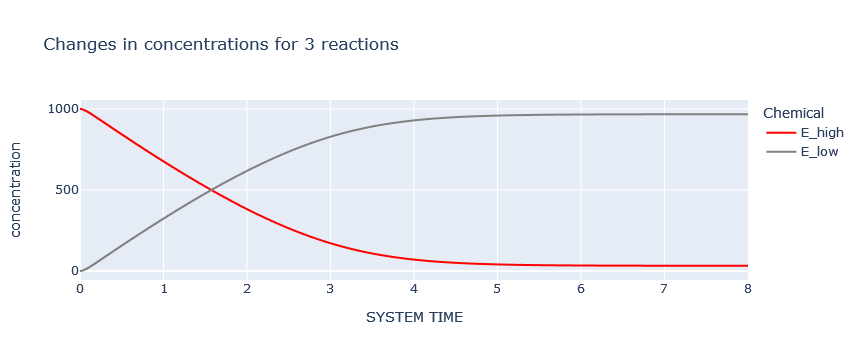

In [29]:
dynamics.plot_curves(chemicals=["E_high", "E_low"], colors=["red", "grey"])

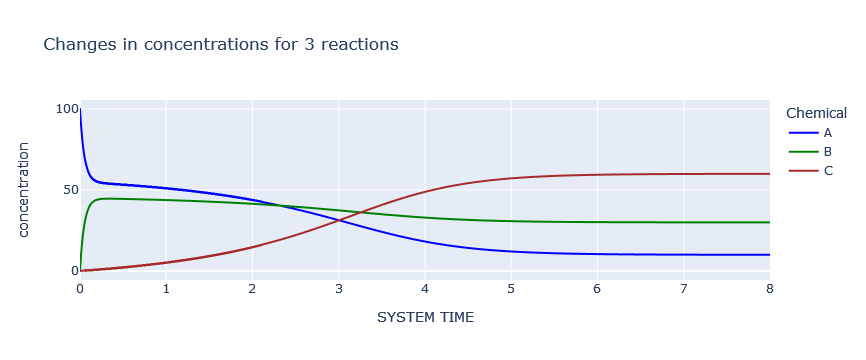

In [30]:
dynamics.plot_curves(chemicals=["A", "B", "C"])

### The plots has 4 distinctive intersections; locate and save them:

In [31]:
run2 = []

In [32]:
run2.append(dynamics.curve_intersection(t_start=1., t_end=2., var1="E_high", var2="E_low"))

Min abs distance found at row: 3144


In [33]:
run2.append(dynamics.curve_intersection(t_start=2.31, t_end=2.33, var1="A", var2="B"))

Min abs distance found at row: 4589
val1 is very close to, or equal to, val2


In [34]:
run2.append(dynamics.curve_intersection(t_start=3., t_end=4., var1="A", var2="C"))

Min abs distance found at row: 5275


In [35]:
run2.append(dynamics.curve_intersection(t_start=3., t_end=4., var1="B", var2="C"))

Min abs distance found at row: 5527


In [36]:
run2

[(1.57355370973624, 500.00000000000057),
 (2.3183999999998557, 40.37073303837859),
 (3.004140103618901, 31.291875890938815),
 (3.2567715819424463, 36.19390521331219)]

# Run # 3. FIXED time resolution, using the smallest time substeps from run # 2  
#### (i.e. FINER fixed resolution than in run #1)


In [37]:
dynamics = ReactionDynamics(reaction_data=chem_data)   # Note: OVER-WRITING the "dynamics" object
dynamics.set_conc(conc=initial_conc, snapshot=True) 
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
5 species:
  Species 0 (A). Conc: 100.0
  Species 1 (B). Conc: 0.0
  Species 2 (C). Conc: 0.0
  Species 3 (E_high). Conc: 1000.0
  Species 4 (E_low). Conc: 0.0


In [38]:
dynamics.set_diagnostics()       # To save diagnostic information about the call to single_compartment_react()

In [39]:
dynamics.single_compartment_react(time_step=0.0004, stop_time=0.03)

In [40]:
dynamics.single_compartment_react(time_step=0.0005, stop_time=5.)

In [41]:
dynamics.single_compartment_react(time_step=0.0025, stop_time=8.)

In [42]:
df = dynamics.get_history()
df

,SYSTEM TIME,A,B,C,E_high,E_low,caption
0,0.0000,100.000000,0.000000,0.000000,1000.000000,0.000000,Initial state
1,0.0004,99.640000,0.360000,0.000000,1000.000000,0.000000,
2,0.0008,99.281728,0.717120,0.001152,1000.000000,0.000000,
3,0.0012,98.925635,1.071381,0.002984,999.999539,0.000461,
4,0.0016,98.571979,1.422804,0.005218,999.998349,0.001651,
...,...,...,...,...,...,...,...
11212,7.9925,10.018385,30.006858,59.974757,32.330481,967.669519,
11213,7.9950,10.018312,30.006830,59.974858,32.330192,967.669808,
11214,7.9975,10.018239,30.006803,59.974958,32.329904,967.670096,
11215,8.0000,10.018166,30.006776,59.975058,32.329618,967.670382,


### Notice we created 11,217 data points, a fair bit more than in run #2, and a good deal more than in run #1

In [43]:
dynamics.explain_time_advance()

From time 0 to 0.03, in 75 FULL steps of 0.0004
From time 0.03 to 5, in 9940 FULL steps of 0.0005
From time 5 to 8, in 1201 FULL steps of 0.0025


## Plots of changes of concentration with time

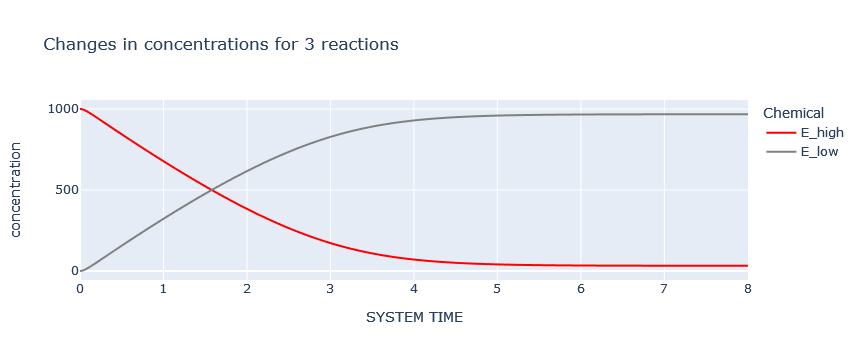

In [44]:
dynamics.plot_curves(chemicals=["E_high", "E_low"], colors=["red", "grey"])

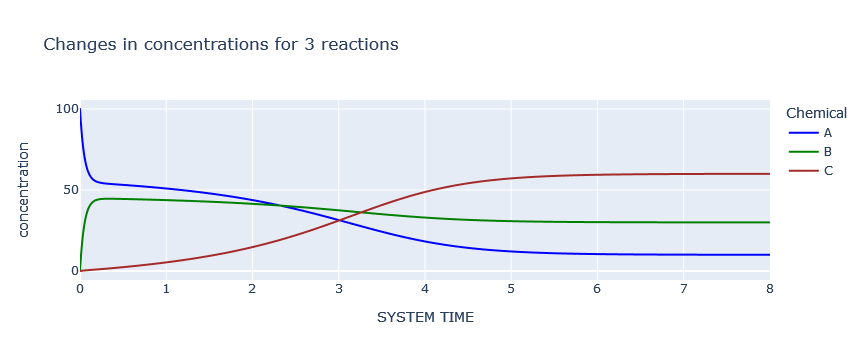

In [45]:
dynamics.plot_curves(chemicals=["A", "B", "C"])

### The plots has 4 distinctive intersections; locate and save them:

In [46]:
run3 = []

In [47]:
run3.append(dynamics.curve_intersection(t_start=1., t_end=2., var1="E_high", var2="E_low"))

Min abs distance found at row: 3172


In [48]:
run3.append(dynamics.curve_intersection(t_start=2.31, t_end=2.33, var1="A", var2="B"))

Min abs distance found at row: 4664


In [49]:
run3.append(dynamics.curve_intersection(t_start=3., t_end=4., var1="A", var2="C"))

Min abs distance found at row: 6035


In [50]:
run3.append(dynamics.curve_intersection(t_start=3., t_end=4., var1="B", var2="C"))

Min abs distance found at row: 6540


In [51]:
run3

[(1.5782924165400347, 500.00000000000097),
 (2.324314772661154, 40.369610560733825),
 (3.0100101552808494, 31.29190450449909),
 (3.262685299694276, 36.193867736703666)]

# Finally, compare (using a Euclidean metric) the discrepancy between the runs
Run #3, at high resolution, could be thought of as "the closest to the actual values"

In [52]:
# Discrepancy of run1 from run3
num.compare_results(run1, run3)

0.00032919271043321753

In [53]:
# Discrepancy of run2 from run3
num.compare_results(run2, run3)

0.011319523897427398

The fact that our measure of distance of run 2 (with intermediate resolution) from run3 is actually GREATER than the distance of run 1 (with low resolution) from run3, might be an artifact of the limited accuracy in the extraction of intersection coordinates from the saved run data.

#### The coordinates of the 4 critical points, from the 3 different runs, are pretty similar to one another - as can be easily seen:

In [54]:
run1

[(1.5782463316015305, 499.9999999999999),
 (2.324208426199163, 40.36968965779538),
 (3.0098252303164066, 31.29187589510951),
 (3.2624567026161637, 36.1939052299051)]

In [55]:
run2

[(1.57355370973624, 500.00000000000057),
 (2.3183999999998557, 40.37073303837859),
 (3.004140103618901, 31.291875890938815),
 (3.2567715819424463, 36.19390521331219)]

In [56]:
run3

[(1.5782924165400347, 500.00000000000097),
 (2.324314772661154, 40.369610560733825),
 (3.0100101552808494, 31.29190450449909),
 (3.262685299694276, 36.193867736703666)]